In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.backends.backend_pdf as pdf
from statsmodels.tsa.seasonal import seasonal_decompose
%matplotlib inline

In [2]:
df = pd.read_csv('nifty50.csv')
df = df.dropna(axis=1)

In [3]:
df.shape[0]

1282

<ipython-input-3-b8c28232f47b>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10, 7))


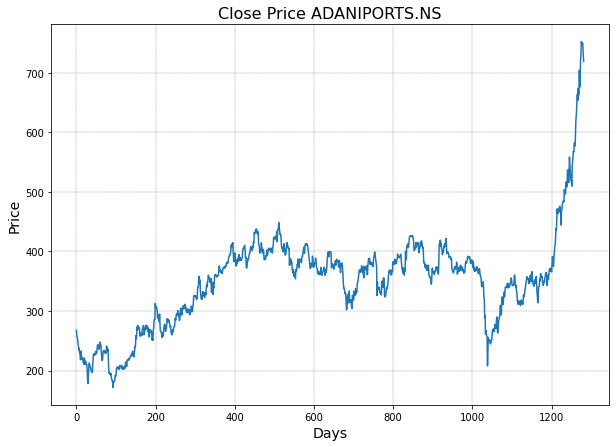

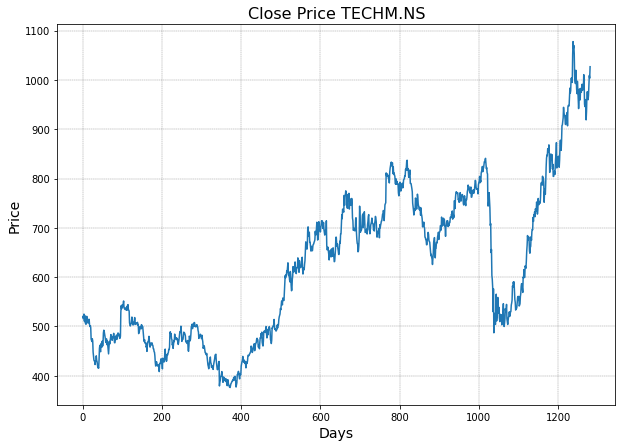

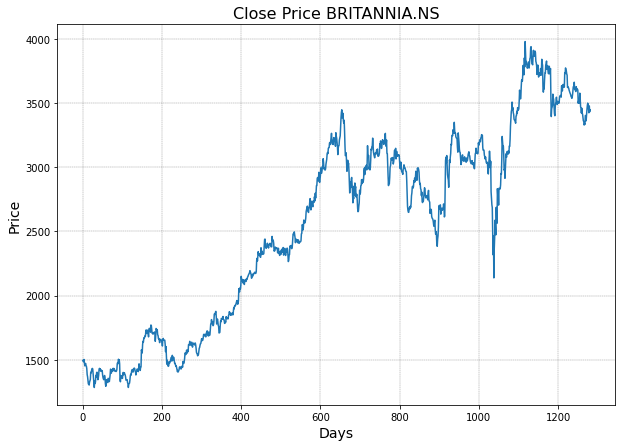

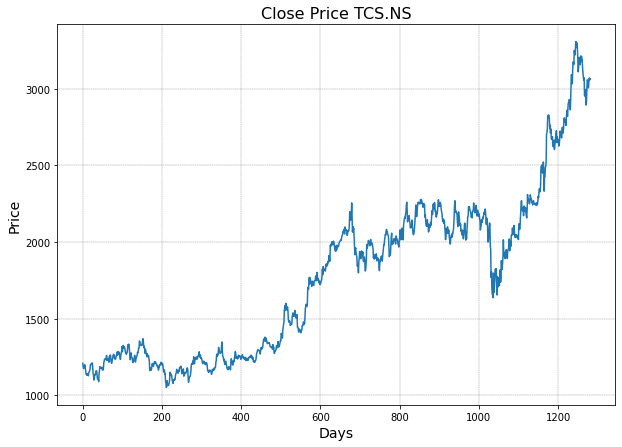

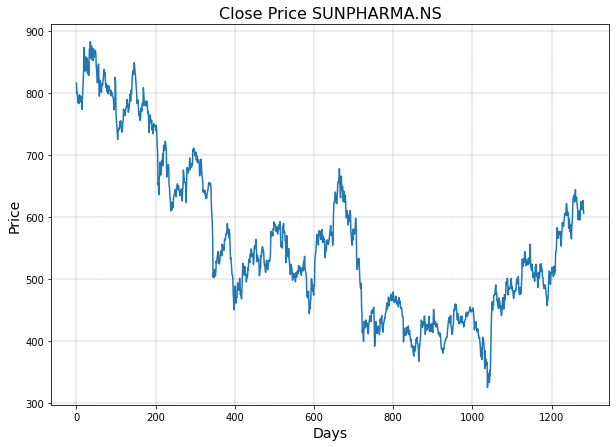

...

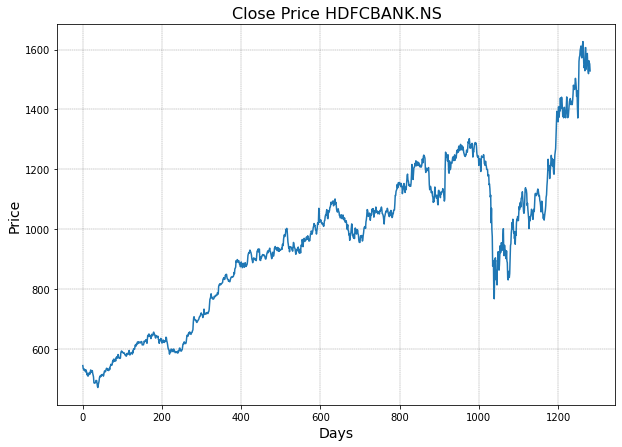

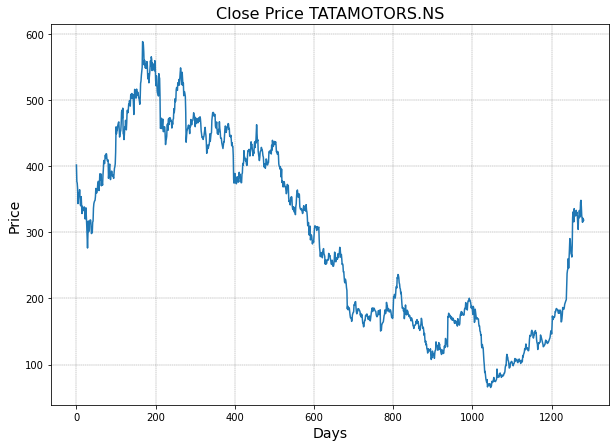

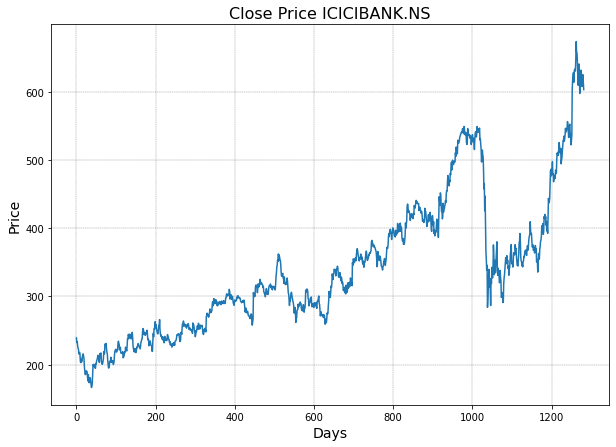

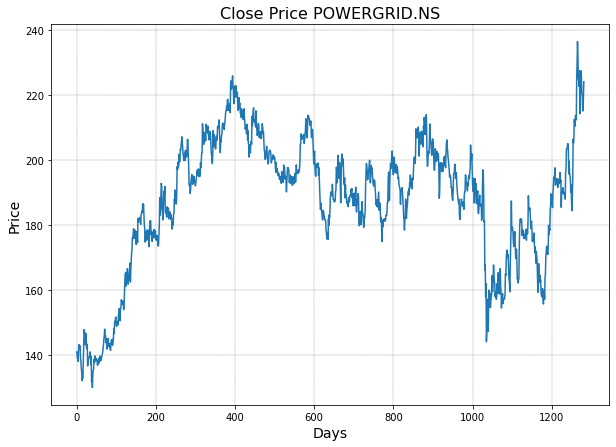

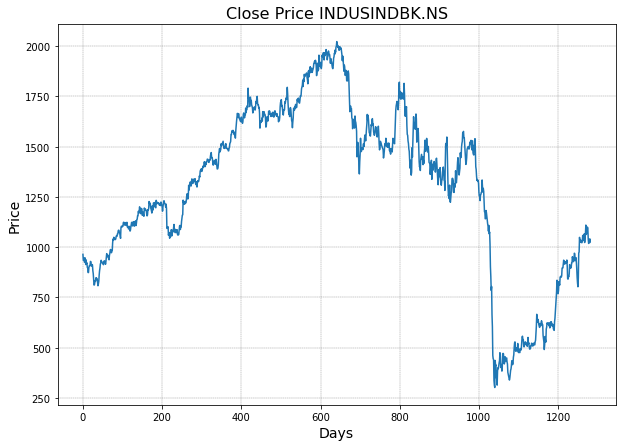

In [3]:
a = []

for i in range(len(df.columns)-1):
    a.append(df.columns[i+1])

x = pdf.PdfPages("prices.pdf")
for i in range(len(a)):
    fig = plt.figure(figsize=(10, 7))
    df[a[i]].plot(figsize=(10, 7))
    plt.title("Close Price " + a[i], fontsize=16)
    plt.ylabel('Price', fontsize=14)
    plt.xlabel('Days', fontsize=14)
    plt.grid(which="major", color='k', linestyle='-.', linewidth=0.2)
    x.savefig(fig)
x.close()

In [4]:
df1 = df.drop(df.tail(277).index)

/Users/subhamgupta/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/seasonal.py:292: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(len(series), 1)


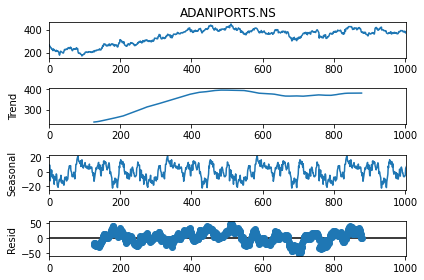

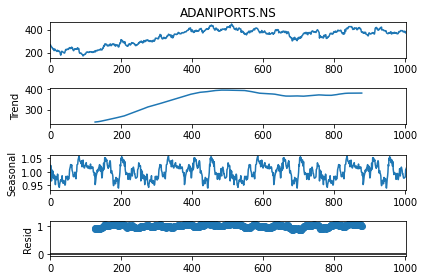

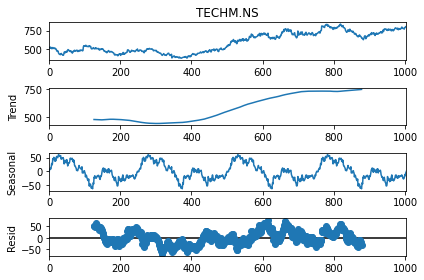

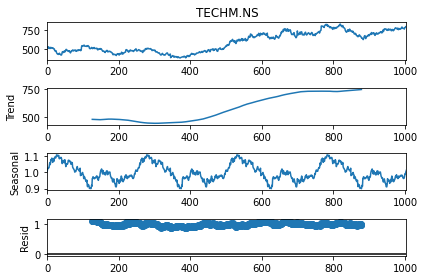

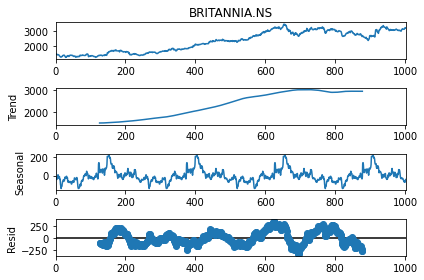

...

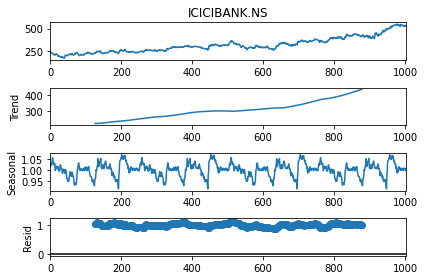

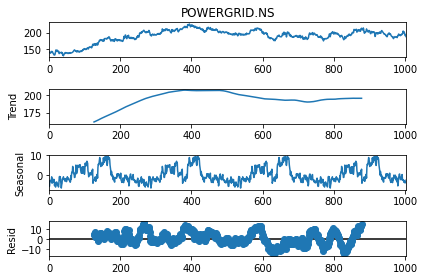

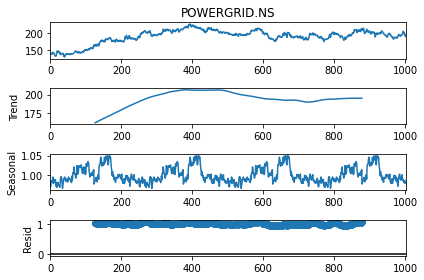

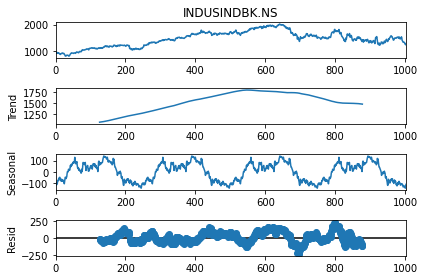

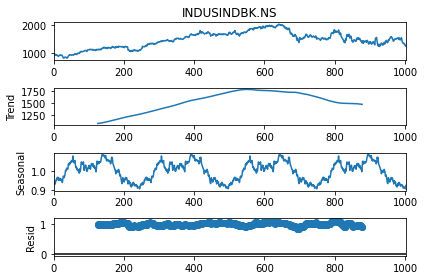

In [5]:
x = pdf.PdfPages("tns.pdf")
for i in range(len(a)):
    res1 = seasonal_decompose(df1[a[i]], model='additive', period = 252)
    y = res1.plot()
    x.savefig(y)
    res2 = seasonal_decompose(df1[a[i]], model='multiplicative', period = 252)
    y = res2.plot()
    x.savefig(y)
x.close()

In [6]:
df2 = pd.DataFrame()
df2['Date'] = df1['Date']

In [7]:
for i in range(len(a)):
    b = []
    b.append(np.nan)
    for j in range(df1.shape[0] - 1):
        b.append(np.log(df1[a[i]][j+1]/df1[a[i]][j]))
    df2[a[i]] = b
    
df2 = df2.iloc[1:]

<ipython-input-8-3913ca58772f>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10, 7))


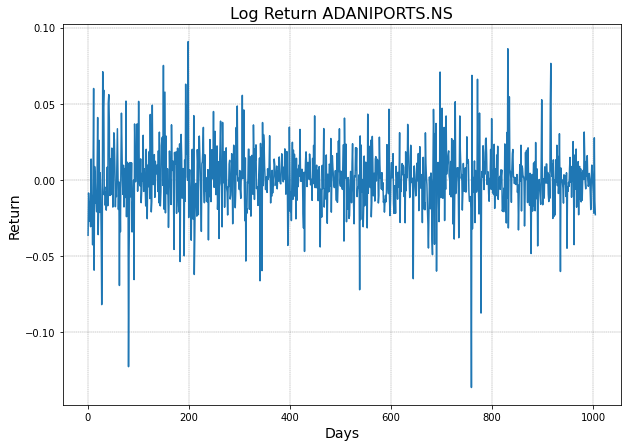

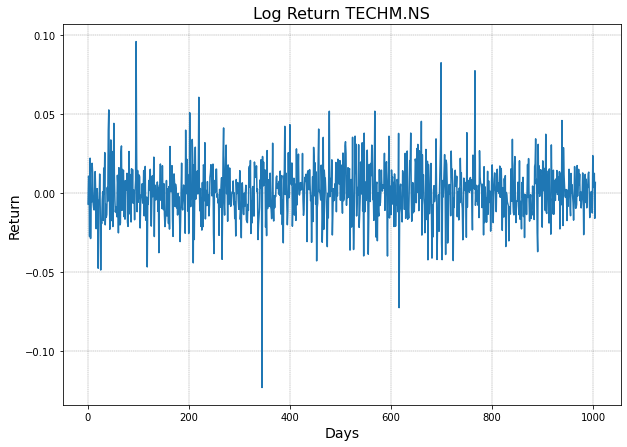

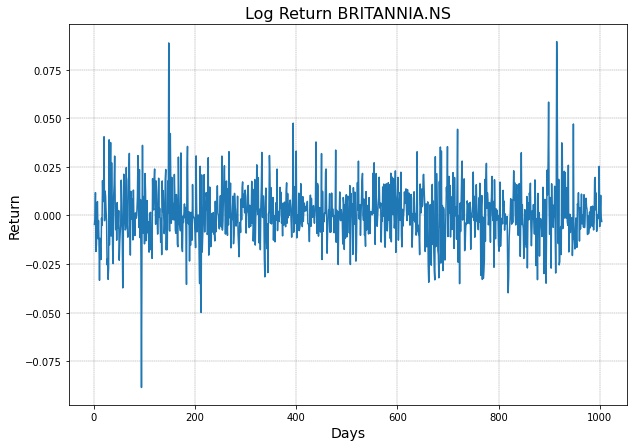

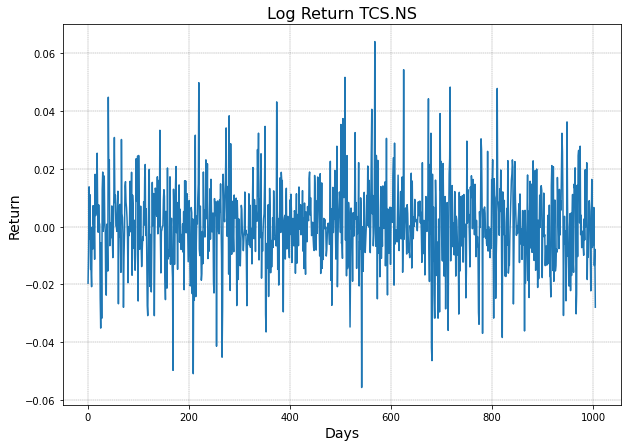

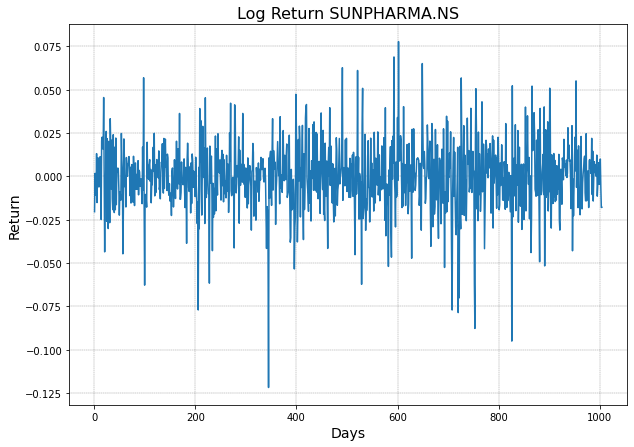

...

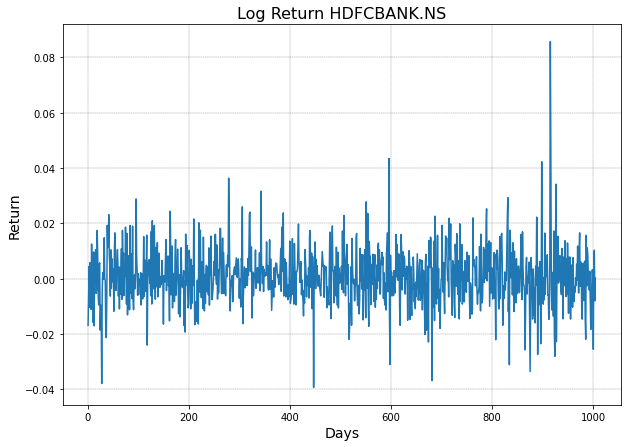

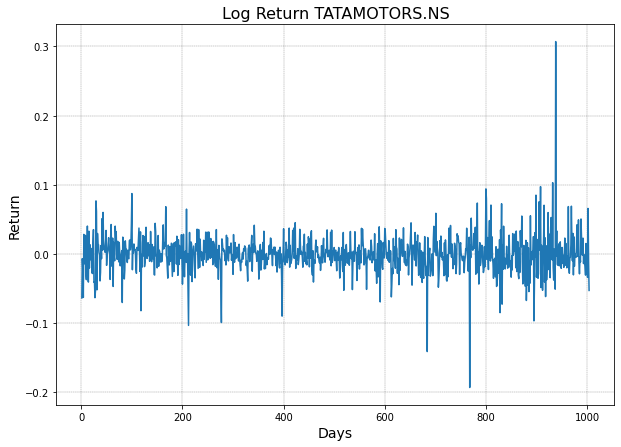

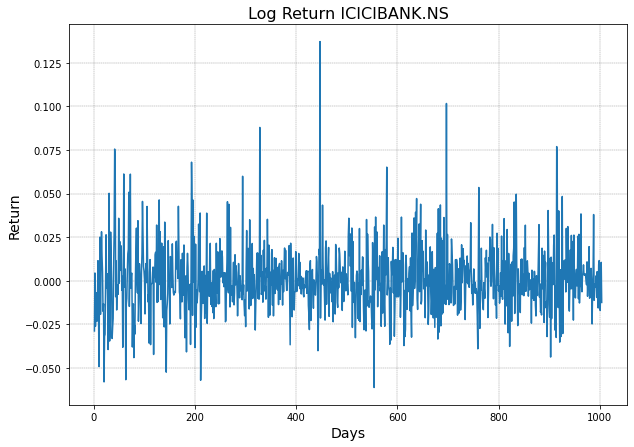

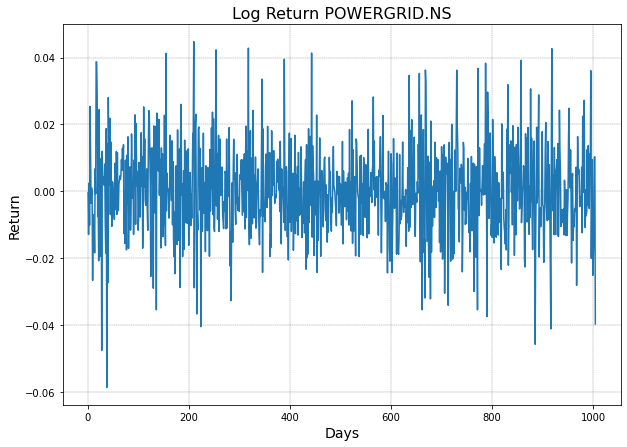

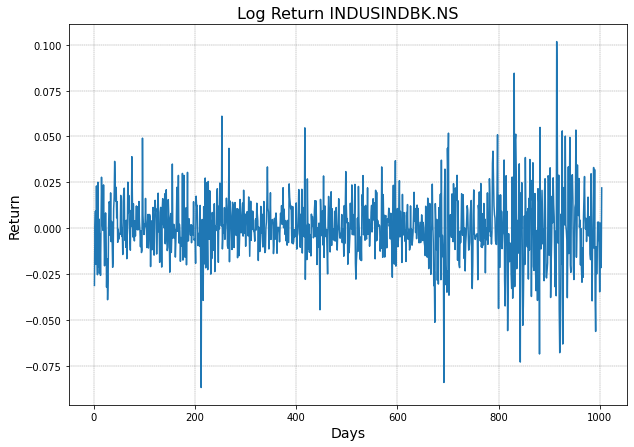

In [8]:
x = pdf.PdfPages("logret.pdf")
for i in range(len(a)):
    fig = plt.figure(figsize=(10, 7))
    df2[a[i]].plot(figsize=(10, 7))
    plt.title("Log Return " + a[i], fontsize=16)
    plt.ylabel('Return', fontsize=14)
    plt.xlabel('Days', fontsize=14)
    plt.grid(which="major", color='k', linestyle='-.', linewidth=0.2)
    x.savefig(fig)
x.close()

In [9]:
df3 = pd.DataFrame()
df3['Date'] = df1['Date']

In [10]:
for i in range(len(a)):
    b = []
    b.append(np.nan)
    for j in range(df1.shape[0] - 1):
        b.append(df1[a[i]][j+1]/df1[a[i]][j])
    df3[a[i]] = b
    
df3 = df3.iloc[1:]

<ipython-input-11-f3662da08d49>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10, 7))


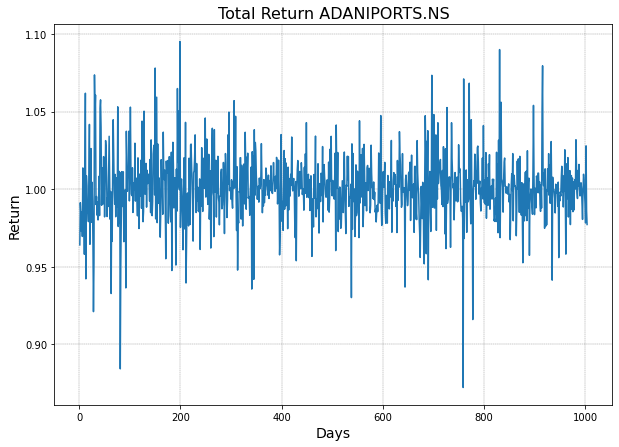

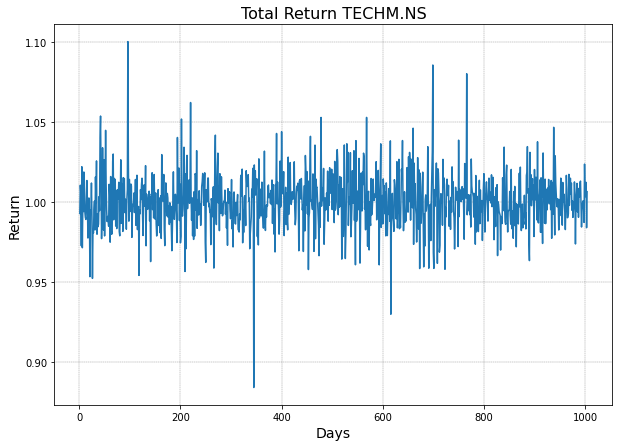

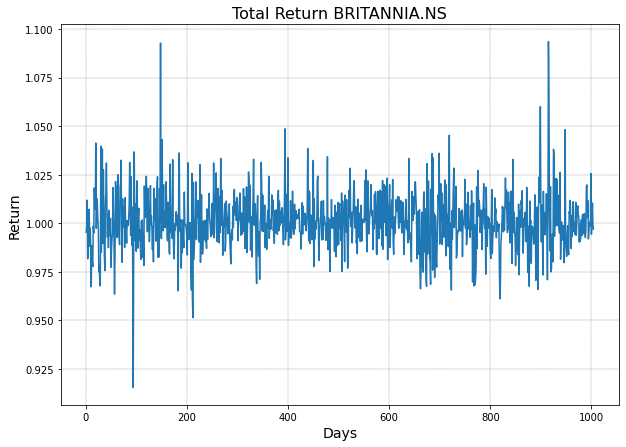

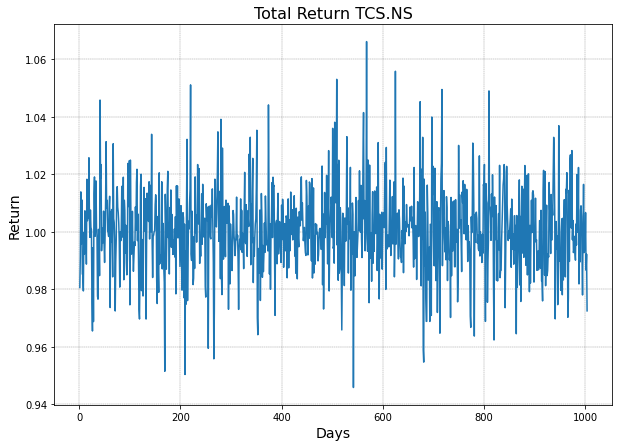

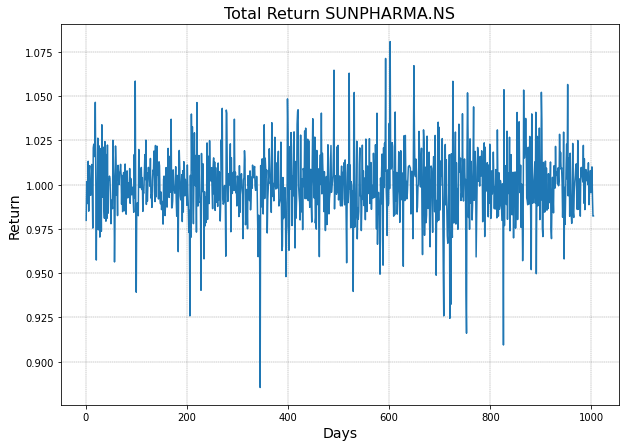

...

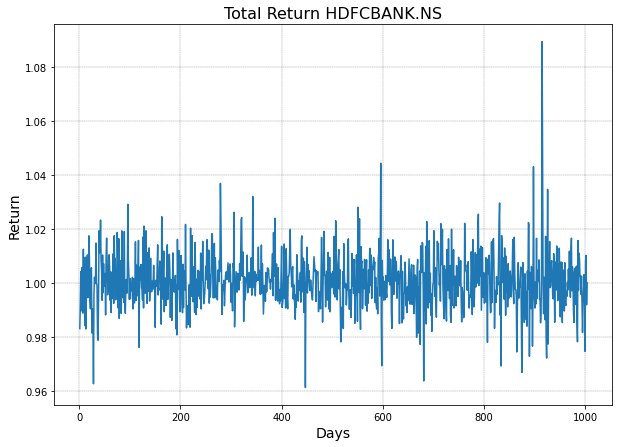

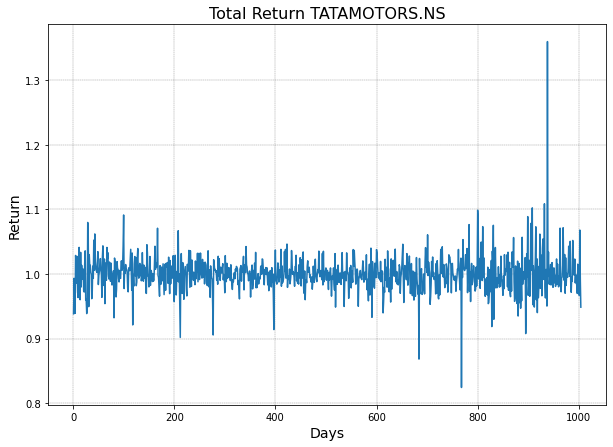

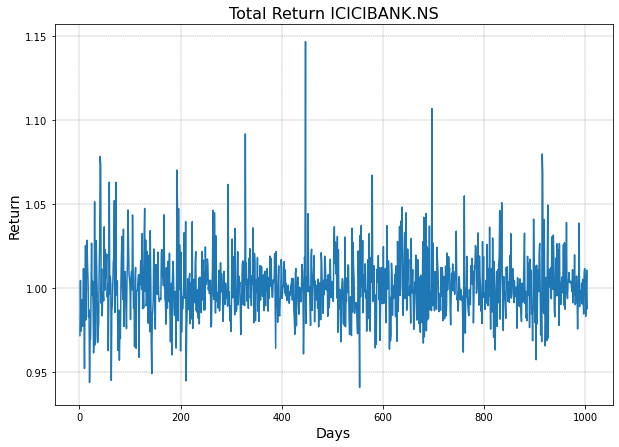

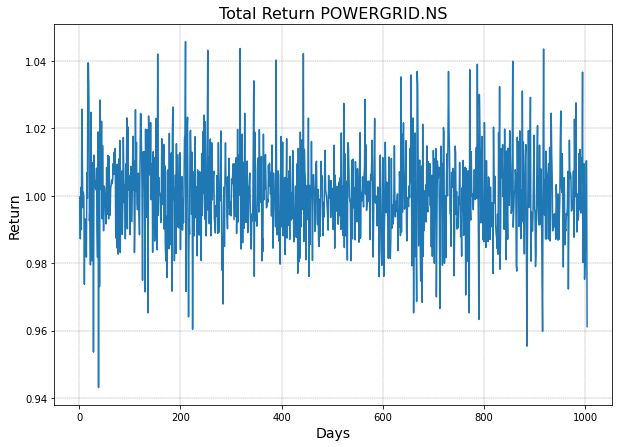

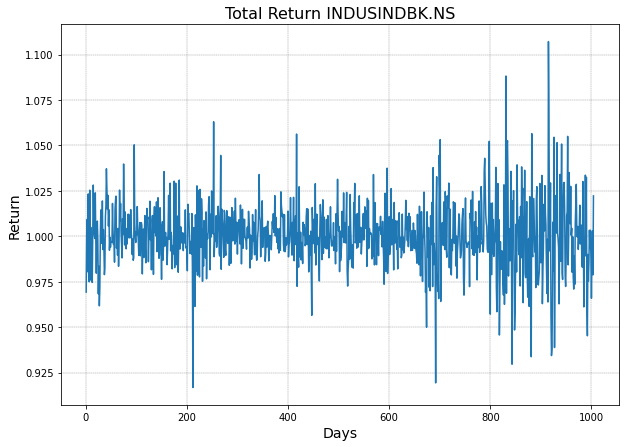

In [11]:
x = pdf.PdfPages("totret.pdf")
for i in range(len(a)):
    fig = plt.figure(figsize=(10, 7))
    df3[a[i]].plot(figsize=(10, 7))
    plt.title("Total Return " + a[i], fontsize=16)
    plt.ylabel('Return', fontsize=14)
    plt.xlabel('Days', fontsize=14)
    plt.grid(which="major", color='k', linestyle='-.', linewidth=0.2)
    x.savefig(fig)
x.close()

/Users/subhamgupta/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/seasonal.py:292: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(len(series), 1)


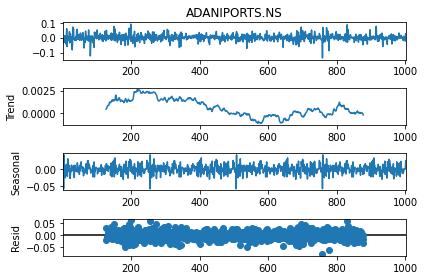

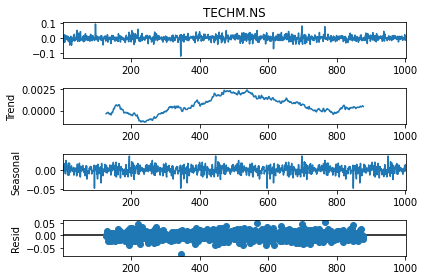

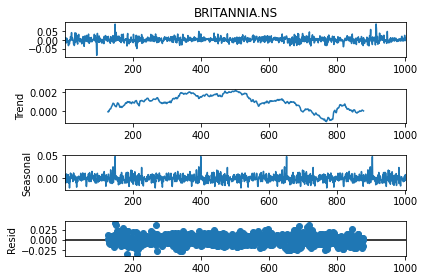

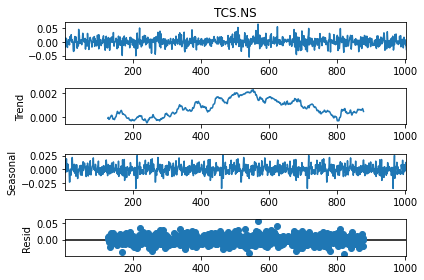

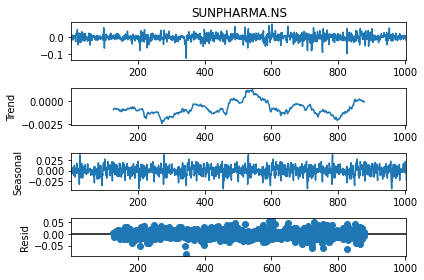

...

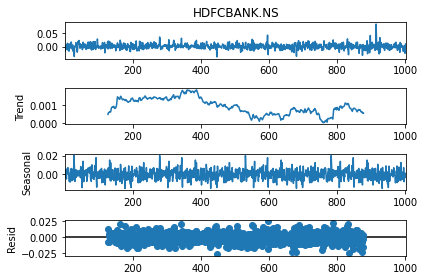

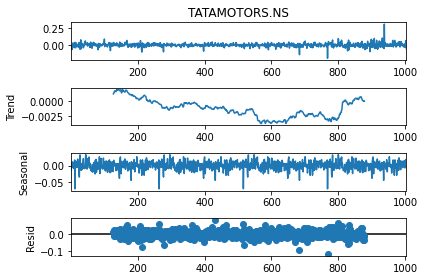

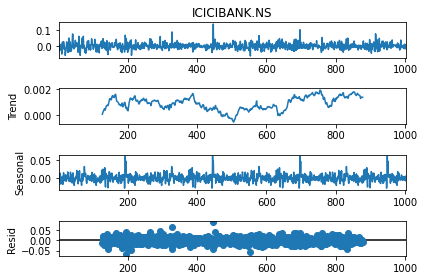

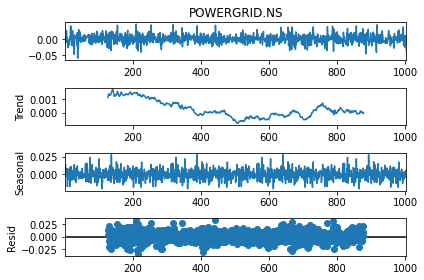

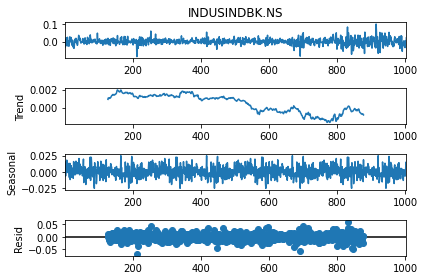

In [12]:
x = pdf.PdfPages("tns_logret.pdf")
for i in range(len(a)):
    res1 = seasonal_decompose(df2[a[i]], model='additive', period = 252) 
    #Multiplicative seasonality is not appropriate for zero and negative values
    y = res1.plot()
    x.savefig(y)
x.close()

/Users/subhamgupta/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/seasonal.py:292: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(len(series), 1)


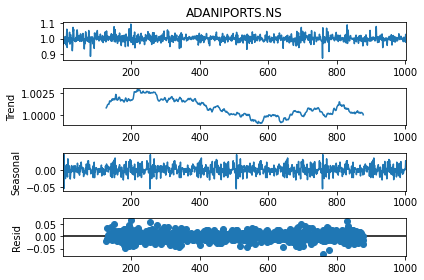

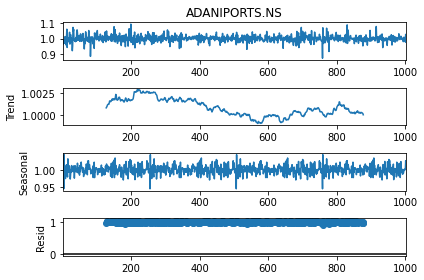

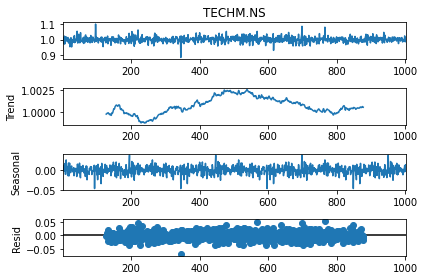

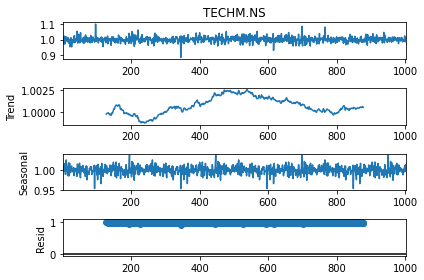

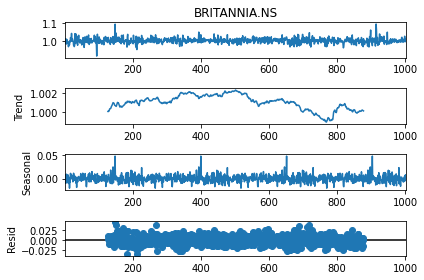

...

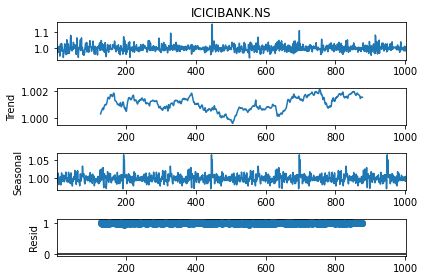

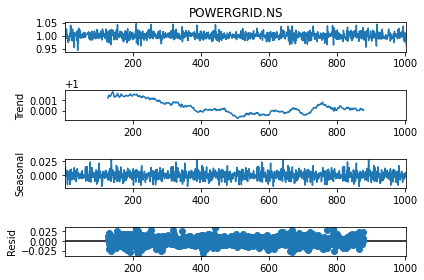

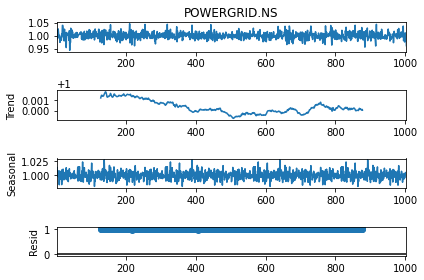

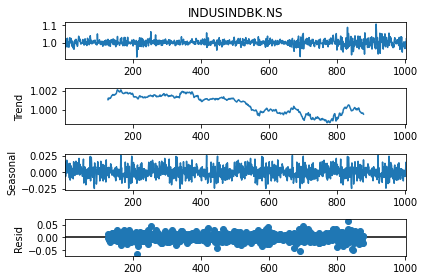

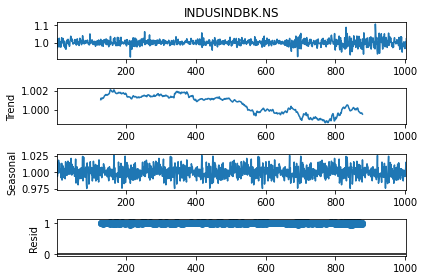

In [13]:
x = pdf.PdfPages("tns_totret.pdf")
for i in range(len(a)):
    res1 = seasonal_decompose(df3[a[i]], model='additive', period = 252)
    y = res1.plot()
    x.savefig(y)
    res2 = seasonal_decompose(df3[a[i]], model='multiplicative', period = 252)
    y = res2.plot()
    x.savefig(y)
x.close()

In [14]:
df2.to_csv('log_returns.csv', index = True)
df3.to_csv('total_returns.csv', index = True)

In [15]:
df1.to_csv('before_COVID.csv')